https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=yieldYear&year=2020
https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=yieldYear&year=2019



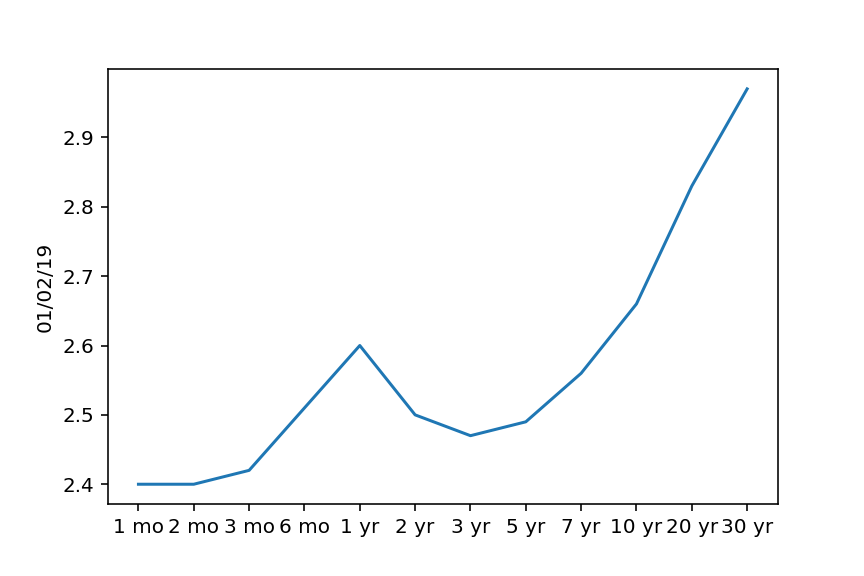
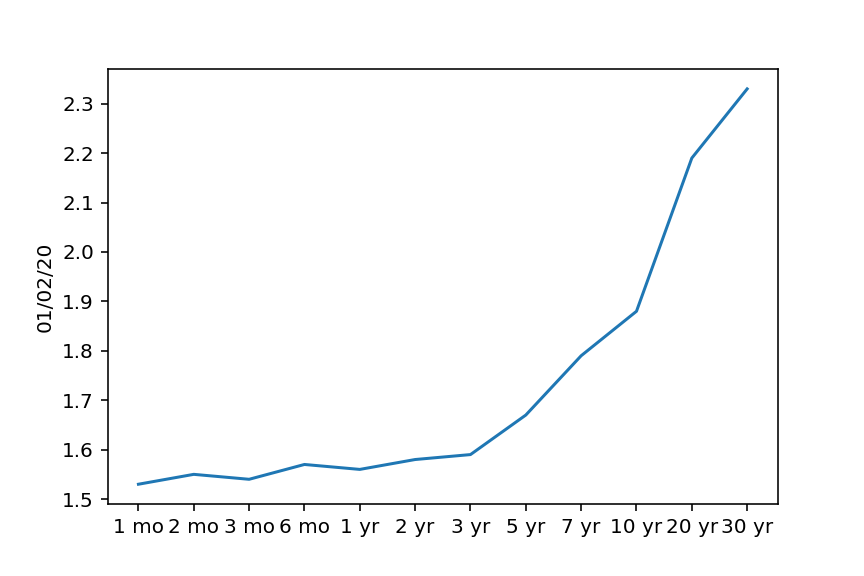
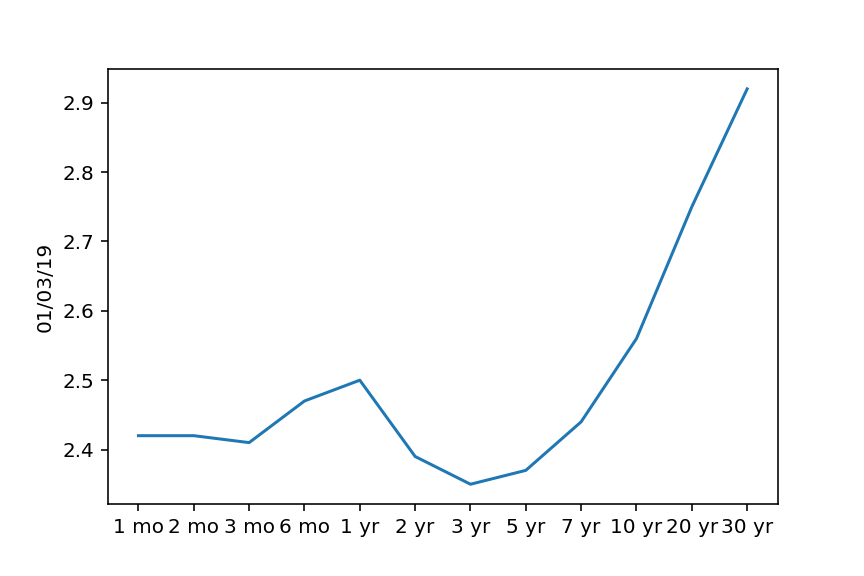
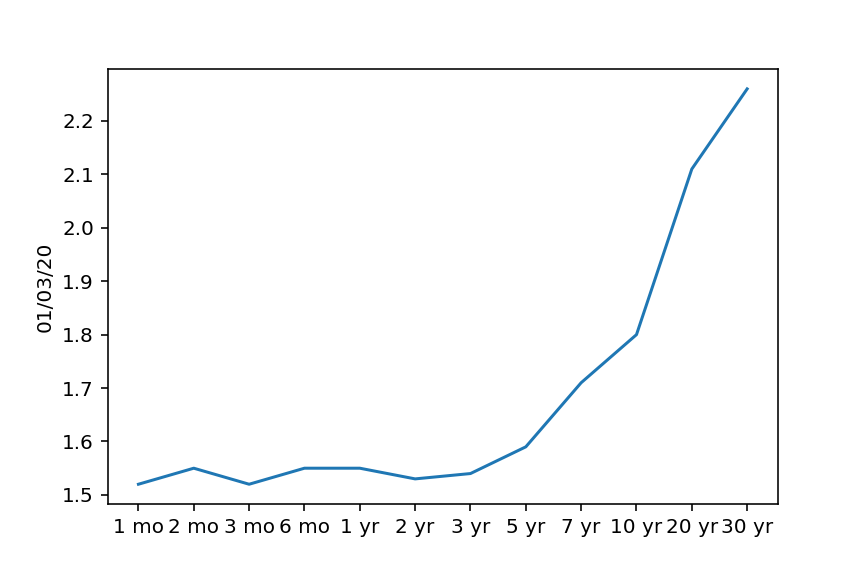
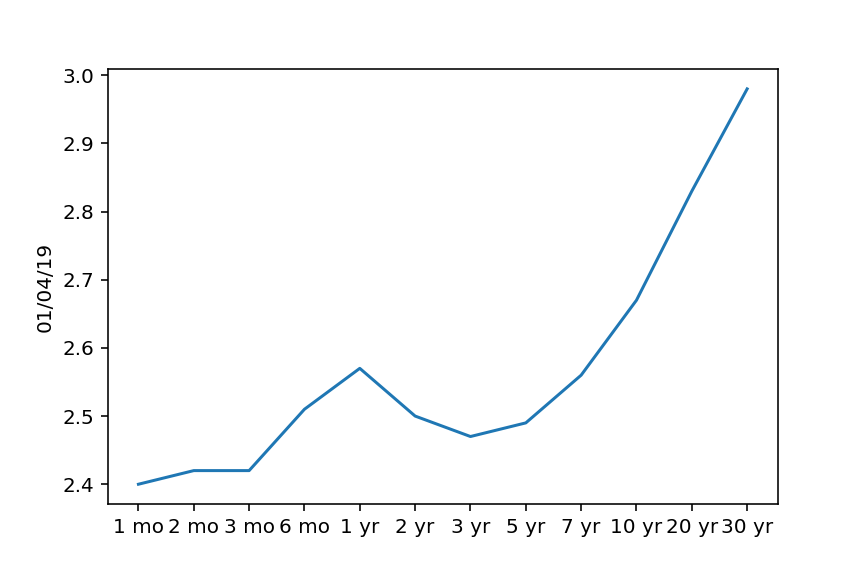
...
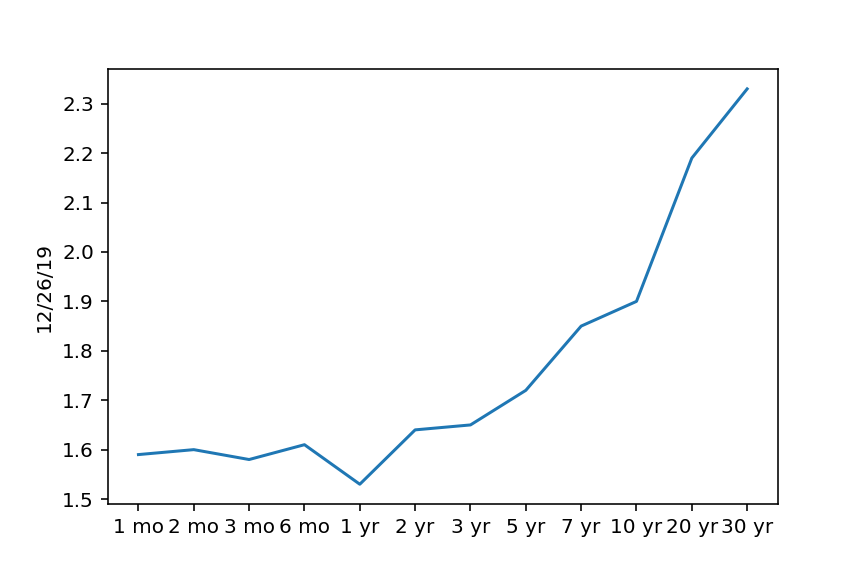
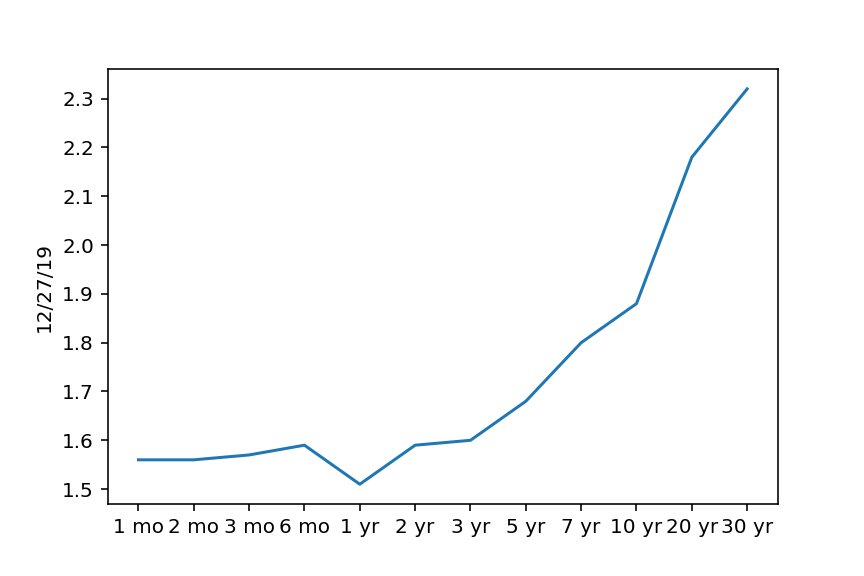
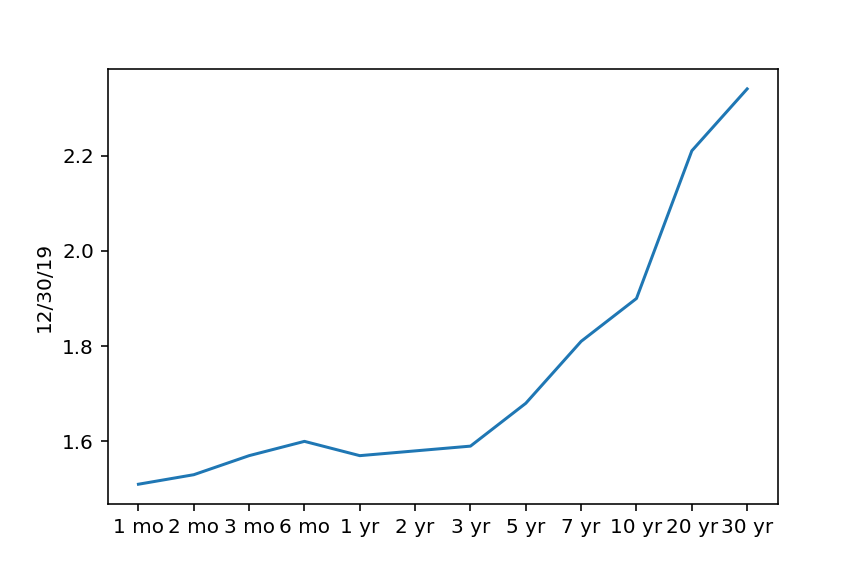
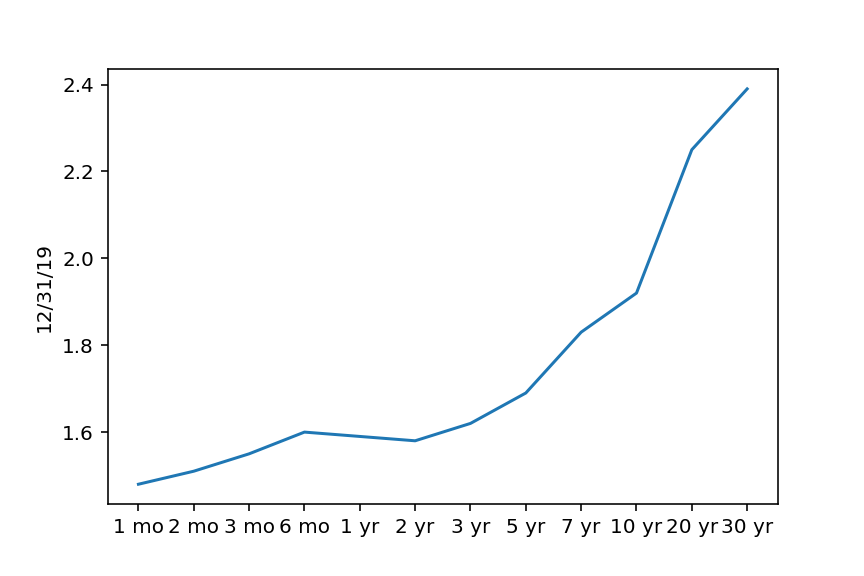
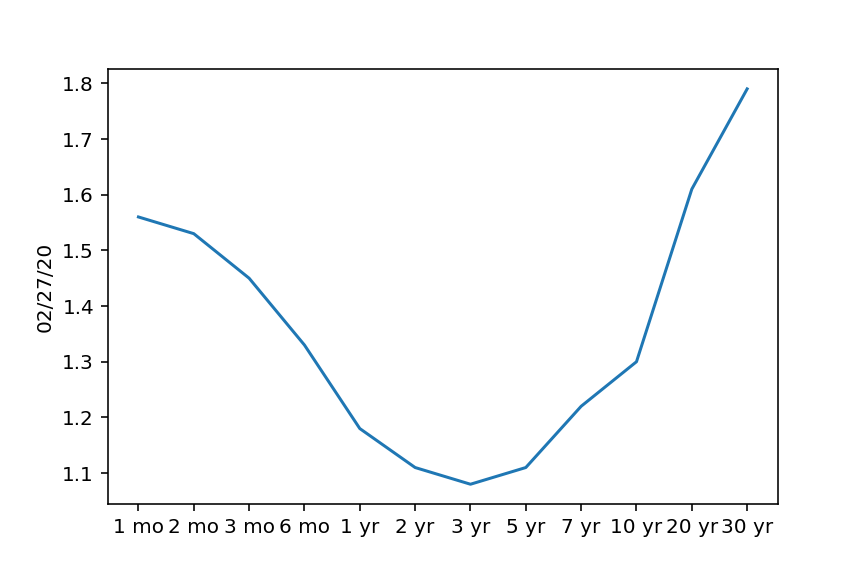

In [4]:
import pandas as pd
import time
import param
import panel as pn
pn.extension()
import matplotlib.pyplot as plt
import seaborn as sns

def get_tsy_web(str_yr):
    time.sleep(1)
    str_url = 'https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=yieldYear&year=%s' % str_yr
    print(str_url)
    df = pd.read_html(str_url)
    return df[1]

list_str_yrs = ['2020','2019']

df_data = pd.concat(get_tsy_web(str_yr) for str_yr in list_str_yrs)
df_data = df_data.fillna(0)
df_data['timestamp'] = pd.to_datetime(df_data['Date'])
df_data = df_data.sort_values('timestamp',ascending=False)
df_data = df_data.drop(['timestamp'], axis=1)

class TreasuryDashboard(param.Parameterized):

    set_date = param.ObjectSelector(default='02/27/20',objects = list(df_data['Date'].unique()))

    def get_data(self):        
        df_row = df_data[df_data['Date']==self.set_date].set_index('Date').T
        return df_row
    
    def line_view(self):
        data = self.get_data()
        y = data[self.set_date]
        x = data.index.values
        ax = sns.lineplot(x,y,sort=False)
        plt.close()
        return ax.figure

    def table_view(self):
        data = self.get_data()
        return data
    
td = TreasuryDashboard(name = '')
dashboard_title = '###Treasury Yield Curve Dashboard'
dashboard_desc = 'Use Selector to Toggle Date'
dashboard = pn.Column(dashboard_title,
                     dashboard_desc,
                     td.param,
                     td.line_view,
                     td.table_view)
dashboard.embed(max_opts=5)